In [26]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import io
import PIL

In [27]:
# Reading in the csv data
data = pd.read_csv(
    '/Users/admin/Documents/Summer Research/data/CASOS_DIARIOS_ACUMULADOS_MUNICIPIOS_.csv',
encoding='latin-1')

In [28]:
data['cve_ent']=data['cve_ent'].astype('object')
data=data.groupby('cve_ent').sum()

In [29]:
# Read Mexico map sh

municipios = gpd.read_file(r'/Users/admin/Documents/Summer Research/Maps/mexico_municipios/muni_2018cw.shp')


In [30]:
municipios['CVEGEO']=municipios['CVEGEO'].astype('int64')
municipios['CVEGEO']=municipios['CVEGEO'].astype('object')



In [31]:
municipios = municipios.drop(columns=['CVE_ENT','CVE_MUN', 'NOM_ENT', 'AREA','NOM_MUN','COV_','COV_ID','PERIMETER'])




In [32]:
merge = municipios.join(data,on='CVEGEO',how='right')

In [33]:
merge= merge.replace(np.nan,0)

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/geopandas/plotting.py:589: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


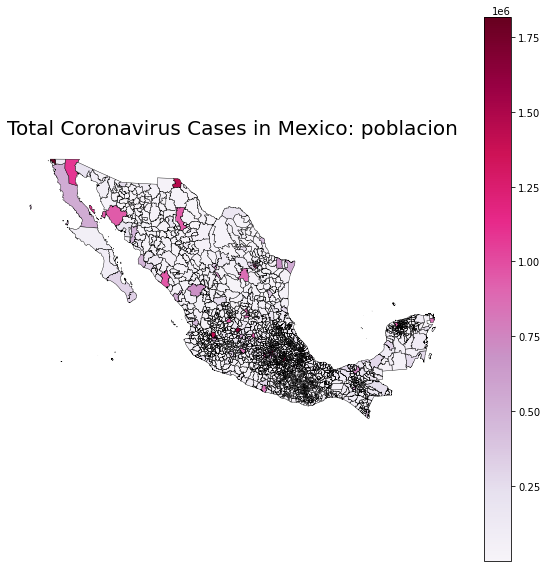

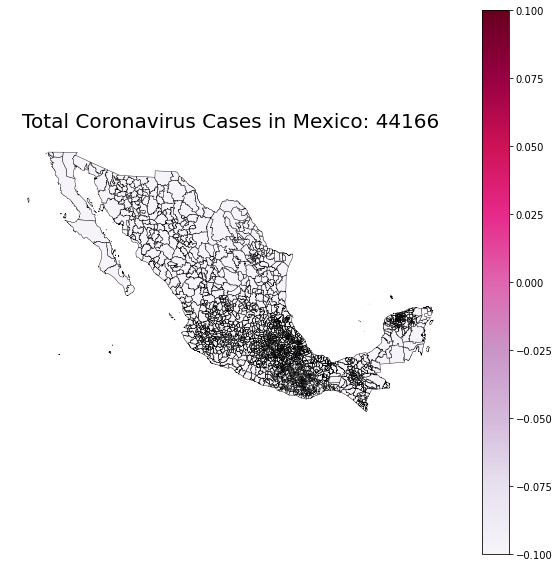

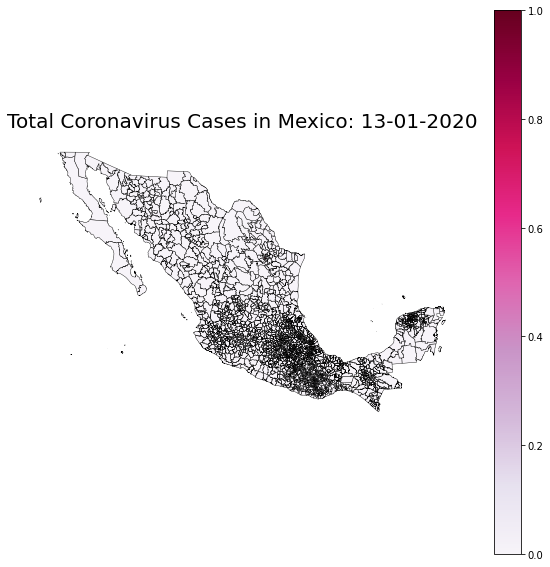

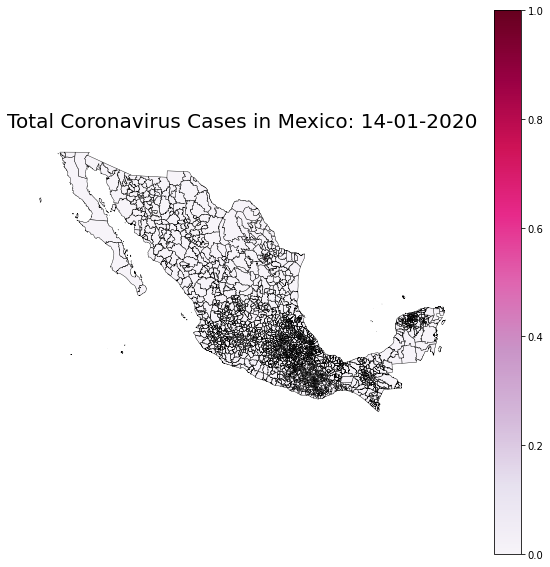

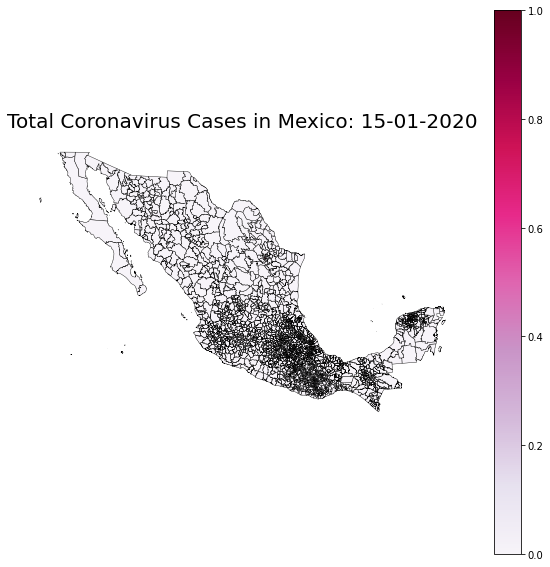

...

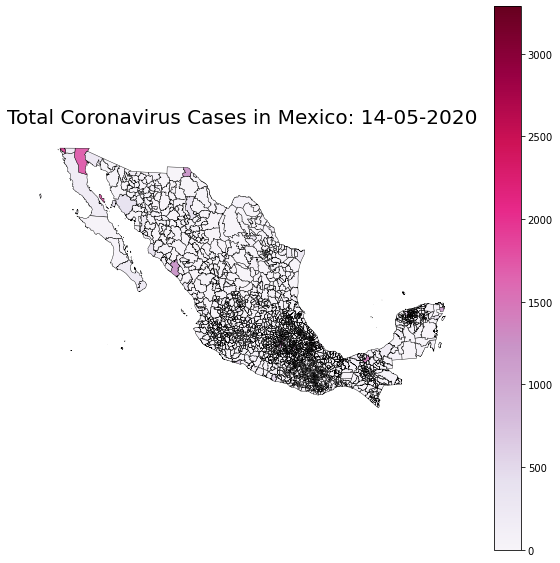

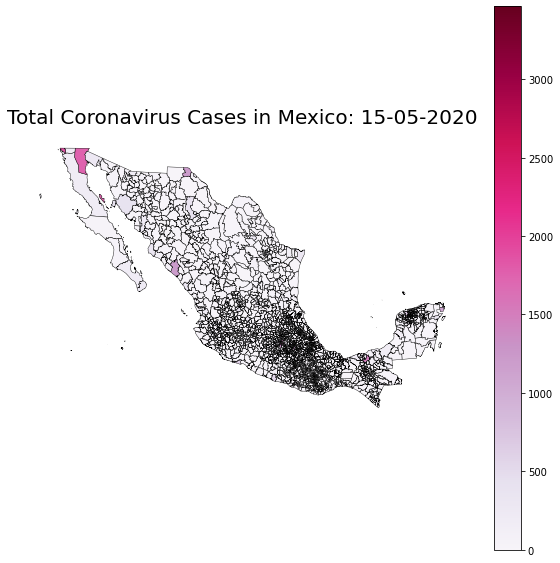

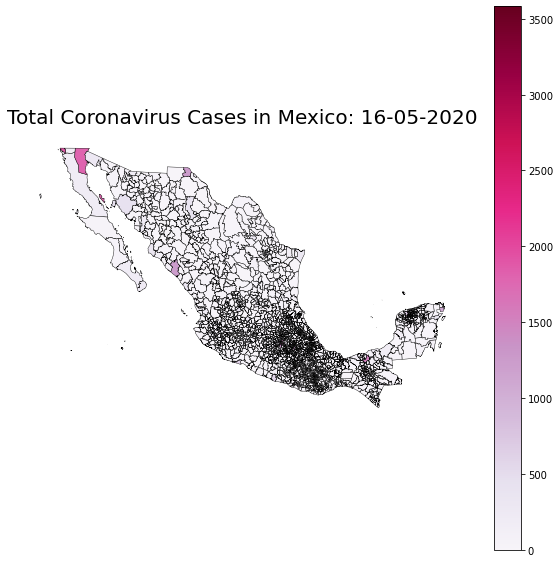

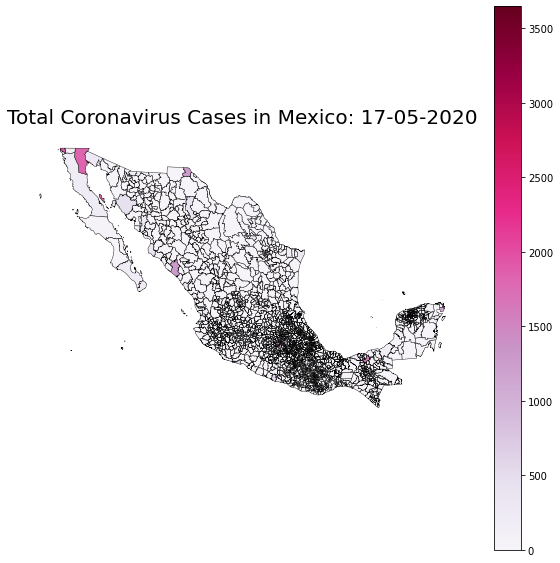

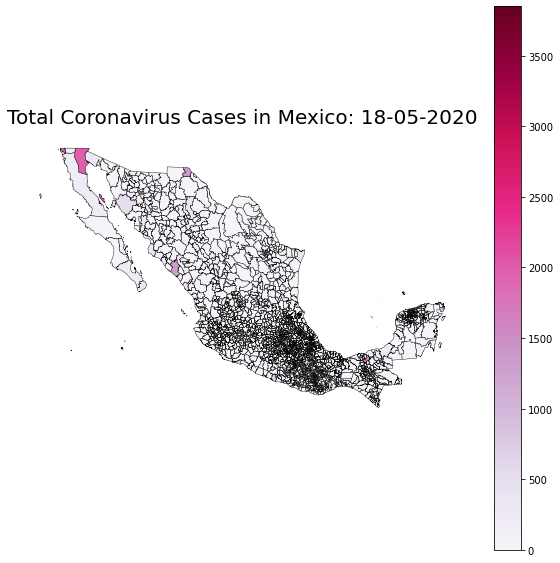

In [ ]:
image_frames = []


for dates in merge.columns.to_list()[2:]:

    # Plot

    ax = merge.plot(column=dates,
                    cmap='PuRd',
                    figsize=(10, 10),
                    legend=True,
                    edgecolor='black',
                    linewidth=0.4)

    # Add a title to the map
    ax.set_title('Total Coronavirus Cases in Mexico: ' +
                 dates, fontdict={'fontsize': 20}, pad=12.5)
    
    
    


    # Removing the axes

    ax.set_axis_off()


    img = ax.get_figure()
    
   


    


    f = io.BytesIO()

    img.savefig(f, format='png', bbox_inches='tight')

    f.seek(0)

    image_frames.append(PIL.Image.open(f))
    

In [ ]:
# creatig gif file


image_frames[0].save('covid_municipal_acumulated.gif',
                     save_all=True,
                     append_images=image_frames[1:],
                     optimize=False,
                     duration=600, 
                     loop=1)

f.close()